# Lang DIALOGUE

In [1]:
import warnings

warnings.filterwarnings("ignore")

In [2]:
from pathlib import Path
import sys

sys.path.insert(1, str(Path().cwd().parent))
import common_config

In [3]:
common_config.figure_journal_basic()

In [4]:
import pertpy as pt
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

In [5]:
adata = sc.read_h5ad("230114_hPCLS_perturbation.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 63581 × 17343
    obs: 'condition', 'modality', 'patient', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'leiden_1', 'leiden_2', 'cell_type', 'cell_type_group', 'sample'
    var: 'n_cells', 'n_counts', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'QC_group_colors', 'cell_type_colors', 'cell_type_group_colors', 'condition_colors', 'dendrogram_cell_type', 'hvg', 'identifier_colors', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'modality_colors', 'name_colors', 'neighbors', 'patient_colors', 'pca', 'rank_genes_groups', 'sample_colors', 'timepoint_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connectivities', 'distances'

In [7]:
adata.obs

,condition,modality,patient,treatment,identifier,n_counts,n_genes,percent_mito,QC_group,doublet_scores,size_factors,leiden_1,leiden_2,cell_type,cell_type_group,sample
muc31175_AAACCCAAGATCCCGC,Fibrotic Cocktail,PCLS,2,FC,muc31175,735.0,481,0.073469,low,0.051087,0.101679,0,7,T cells,T cells,FC_2
muc31175_AAACCCAAGTAAAGCT,Fibrotic Cocktail,PCLS,2,FC,muc31175,4782.0,2074,0.035968,low,0.020891,0.772610,4,2,ectopic EC,vascular EC,FC_2
muc31175_AAACCCACAAGTTGGG,Fibrotic Cocktail,PCLS,2,FC,muc31175,1304.0,773,0.007669,low,0.027234,0.188760,1,0,Mast cells,Mast cells,FC_2
muc31175_AAACCCACACCAAAGG,Fibrotic Cocktail,PCLS,2,FC,muc31175,1986.0,1118,0.043807,low,0.164641,0.300193,1,0,Mast cells,Mast cells,FC_2
muc31175_AAACCCACACCTCGTT,Fibrotic Cocktail,PCLS,2,FC,muc31175,2049.0,986,0.060517,low,0.138672,0.283763,21,33,B cells,B cells,FC_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
muc24279_TTTGATCGTTAGTCGT,Fibrotic Cocktail,PCLS,1,FC,muc24279,10589.0,3476,0.014166,medium,0.050000,1.779824,2,5,capillary EC,capillary EC,FC_1
muc24279_TTTGATCGTTCCCACT,Fibrotic Cocktail,PCLS,1,FC,muc24279,658.0,438,0.004559,medium,0.047490,0.107031,17,18,Fibroblasts,Fibroblasts,FC_1
muc24279_TTTGGAGCACGATAGG,Fibrotic Cocktail,PCLS,1,FC,muc24279,5930.0,2419,0.037605,medium,0.038509,0.972865,15,14,Pericytes,SMC/Pericytes,FC_1
muc24279_TTTGTTGCAAGACAAT,Fibrotic Cocktail,PCLS,1,FC,muc24279,2786.0,1487,0.045226,medium,0.042802,0.472818,19,20,Mast cells,Mast cells,FC_1


In [8]:
isecs = pd.crosstab(adata.obs["cell_type"], adata.obs["sample"])
isecs
(isecs > 3).sum(axis=1)

cell_type
AT1                  8
AT2                  6
Aberrant Basaloid    8
Basal                7
Ciliated             7
Secretory            8
capillary EC         8
arterial EC          3
venous EC            5
ectopic EC           8
lymphatic EC         8
Fibroblasts          8
Myofibroblasts       8
Pericytes            8
SMC                  7
Macrophages          8
SPP1+ Macrophages    8
DC                   8
Mast cells           8
B cells              8
Plasma cells         8
T cells              8
NK cells             8
dtype: int64

In [9]:
dl = pt.tl.Dialogue(
    sample_id="sample",
    celltype_key="cell_type",
    n_counts_key="n_counts",
    n_mpcs=3,
)

In [10]:
adata.obs.groupby('cell_type')['sample'].nunique()

cell_type
AT1                  8
AT2                  8
Aberrant Basaloid    8
Basal                8
Ciliated             8
Secretory            8
capillary EC         8
arterial EC          4
venous EC            6
ectopic EC           8
lymphatic EC         8
Fibroblasts          8
Myofibroblasts       8
Pericytes            8
SMC                  8
Macrophages          8
SPP1+ Macrophages    8
DC                   8
Mast cells           8
B cells              8
Plasma cells         8
T cells              8
NK cells             8
Name: sample, dtype: int64

In [11]:
adata = adata[~adata.obs["cell_type"].isin({"arterial EC", "venous EC"})]

In [12]:
adata, mcps, ws, ct_subs = dl.calculate_multifactor_PMD(adata, normalize=True)

In [19]:
adata.write("hPCLS_MCPS.h5ad")

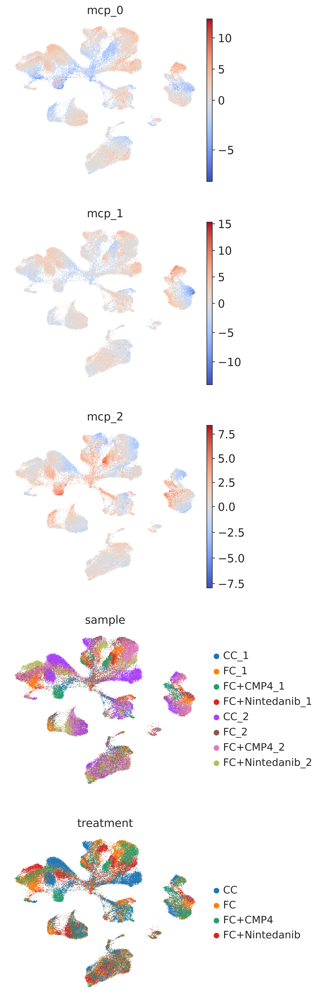

In [13]:
sc.pl.umap(
    adata,
    color=["mcp_0", "mcp_1", "mcp_2", "sample", "treatment"],
    ncols=1,
    cmap="coolwarm",
    vcenter=0,
)

In [15]:
dl.test_association(adata, "treatment", conditions_compare=("CC", "FC"))

{'pvals':                       mcp_0     mcp_1     mcp_2
 AT1                0.713980  0.343876  0.082418
 AT2                0.764878  0.579860  0.842427
 Aberrant Basaloid  0.857487  0.230858  0.302473
 Basal              0.789216  0.282787  0.296866
 Ciliated           0.985326  0.435419  0.630355
 Secretory          0.987296  0.730663  0.385411
 capillary EC       0.922976  0.431647  0.027509
 ectopic EC         0.849581  0.423861  0.255123
 lymphatic EC       0.874588  0.239330  0.254274
 Fibroblasts        0.835919  0.503902  0.762019
 Myofibroblasts     0.616448  0.375166  0.115431
 Pericytes          0.707871  0.407344  0.251498
 SMC                0.968746  0.592785  0.493026
 Macrophages        0.925716  0.723199  0.467025
 SPP1+ Macrophages  0.954573  0.471067  0.002684
 DC                 0.670534  0.793749  0.412016
 Mast cells         0.939326  0.578065  0.663578
 B cells            0.761125  0.399507  0.967197
 Plasma cells       0.894550  0.204978  0.417875
 T cells   